### Display model predicted images (random 100/2500 test images)

In [1]:
import os
import random
import json
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
gray_test_dir = "./data_subset/gray/test"
rgb_test_dir = "./data_subset/rgb/test"
pred_dir = "./predictions"
metrics_path = "./eval_results.json"
DISPLAY_N_IMAGES = 20

=== Evaluation Metrics ===
MAE: 0.0455
PSNR: 24.7847
SSIM: 0.9395
Total test images found: 15000


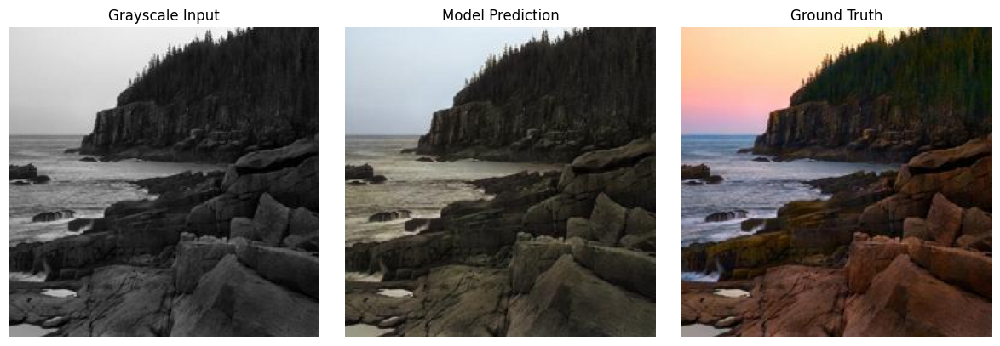

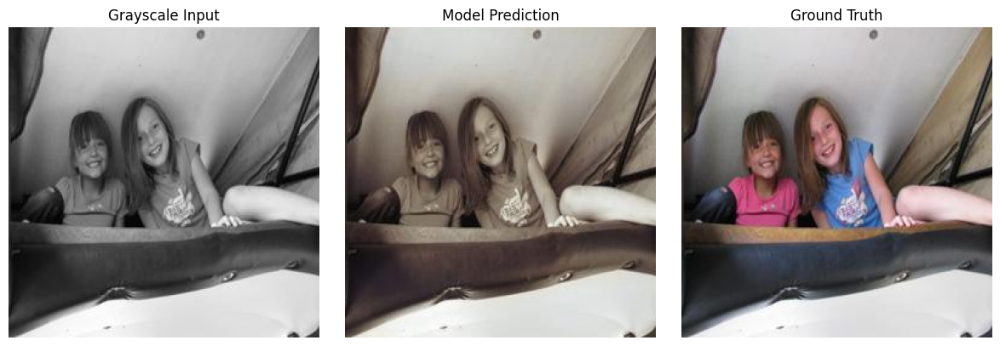

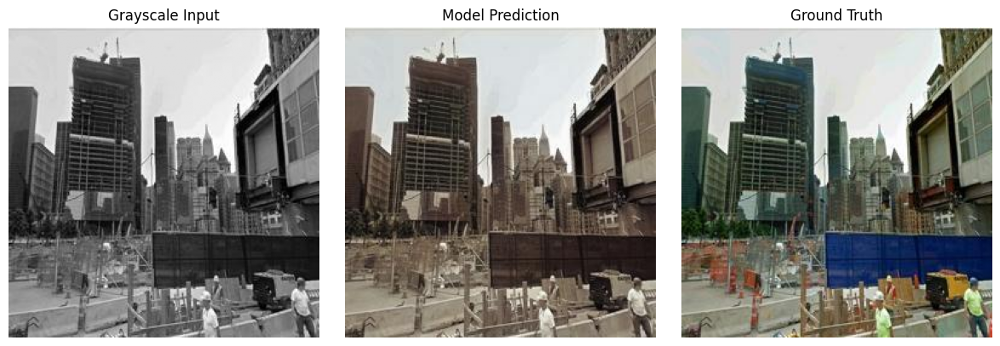

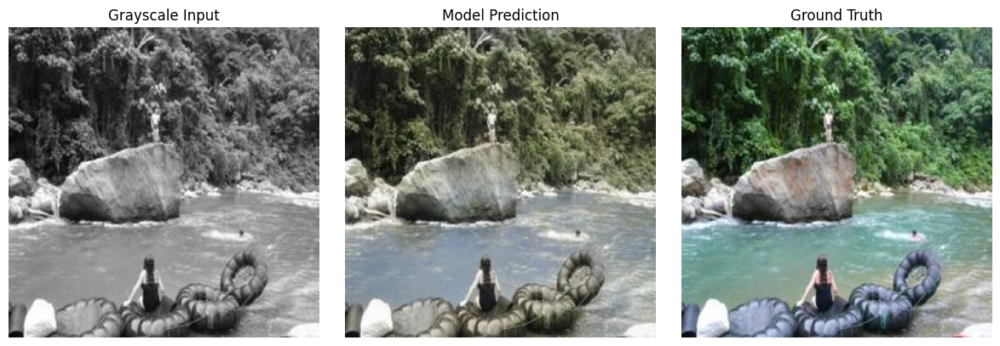

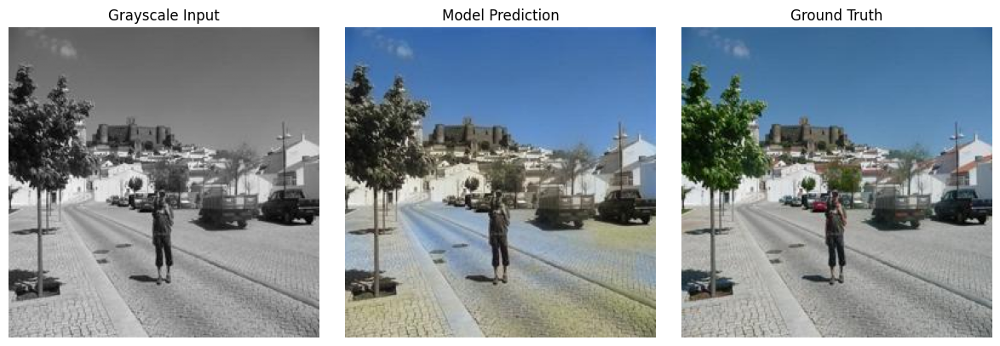

...

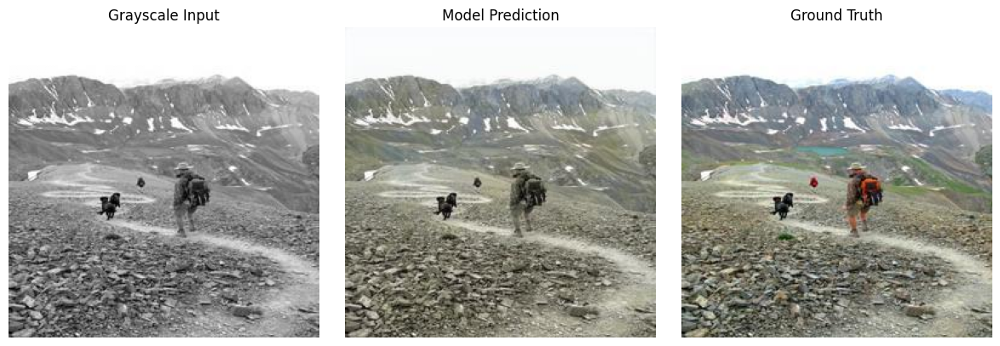

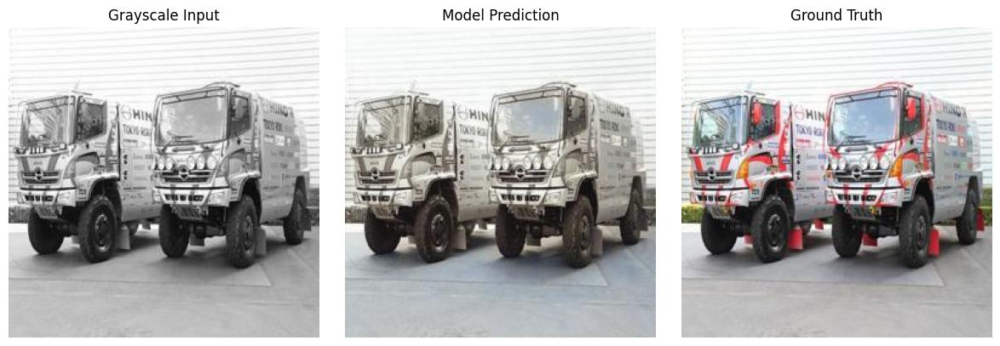

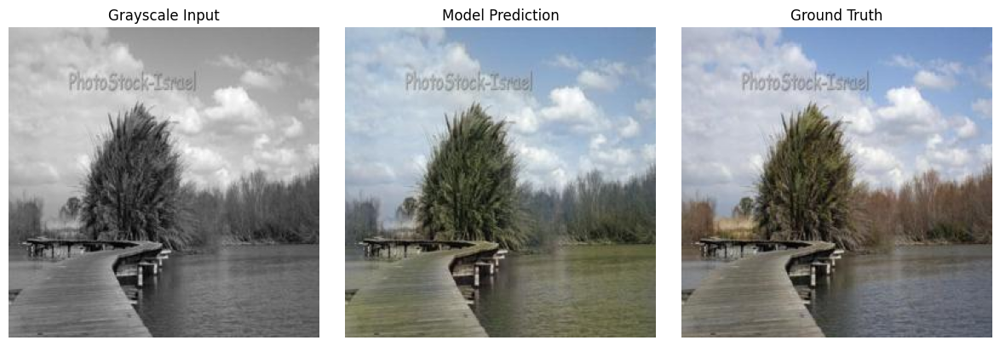

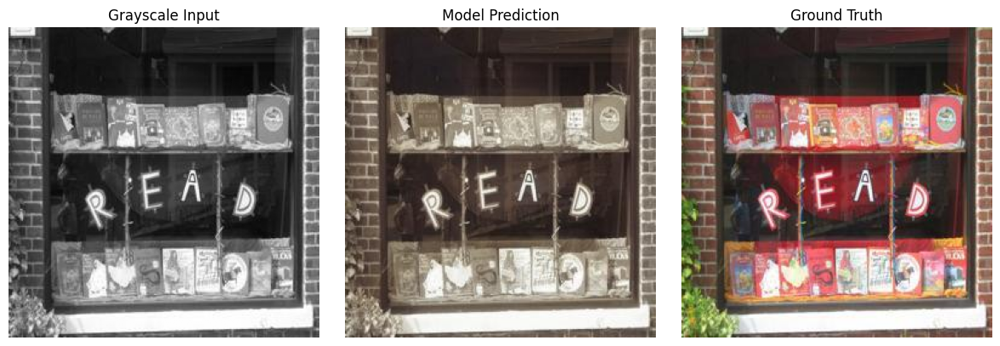

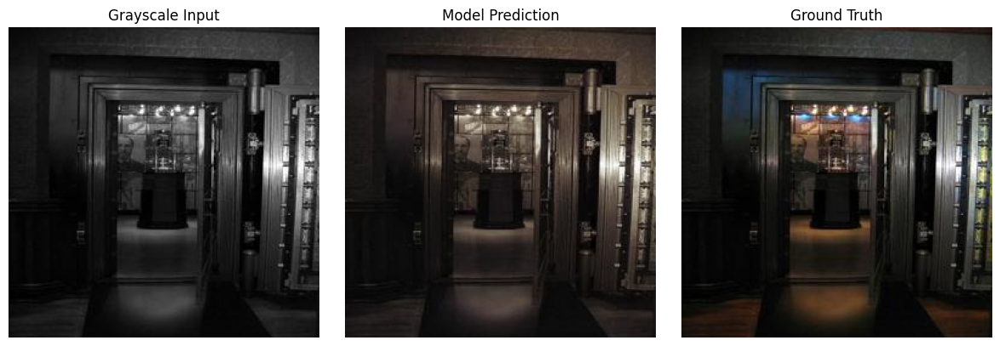

In [3]:
with open(metrics_path, "r") as f:
    metrics = json.load(f)

print("=== Evaluation Metrics ===")
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

all_files = [f for f in os.listdir(gray_test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
print(f"Total test images found: {len(all_files)}")

random.seed(42)
sample_files = random.sample(all_files, DISPLAY_N_IMAGES)

def load_image(path):
    return Image.open(path).convert("RGB")

def show_triplet(gray_path, pred_path, gt_path):
    gray_img = Image.open(gray_path).convert("L")
    pred_img = load_image(pred_path)
    gt_img = load_image(gt_path)

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    axes[0].imshow(gray_img, cmap="gray")
    axes[0].set_title("Grayscale Input")
    axes[0].axis("off")

    axes[1].imshow(pred_img)
    axes[1].set_title("Model Prediction")
    axes[1].axis("off")

    axes[2].imshow(gt_img)
    axes[2].set_title("Ground Truth")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

for filename in sample_files:
    gray_path = os.path.join(gray_test_dir, filename)
    pred_path = os.path.join(pred_dir, filename)
    gt_path = os.path.join(rgb_test_dir, filename)

    if os.path.exists(pred_path):
        show_triplet(gray_path, pred_path, gt_path)
    else:
        print(f"Prediction not found for {filename}")